In [360]:
import os
import matplotlib.animation as animation
import matplotlib.colors as clr
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import pandas as pd
from tifffile import imread
from rich.progress import track
from matplotlib.patches import Rectangle
import ast

In [361]:
# Enhanced parameters
um_per_pixel = 0.117
s_per_frame = 0.1

# MAIN DATA CONFIGURATION - UPDATE THESE PATHS FOR YOUR DATA
folder_save = "/Users/esumrall/Desktop/RNA-in-HOPS_condensates/representative/FL-2x/original"  # UPDATE THIS PATH
os.chdir(folder_save)

# File names - UPDATE THESE FOR YOUR SPECIFIC FILES
video_filename = "Merged-FOV-2-FL-2x.tif"                                                         # Your video file
tracks_filename = "SPT_results_AIO-20220508-FLmRNA_2x_FOV-2-right_reformatted.csv"                # Your particle tracks
condensates_filename = "condensates_AIO-20220508-FLmRNA_2x_FOV-2-cropped-left_original.csv"  # Your condensate boundaries

# Verify setup
print(f"✅ Working directory: {os.getcwd()}")
print(f"📂 Files to load:")
print(f"   🎬 Video: {video_filename}")
print(f"   🎯 Tracks: {tracks_filename}")
print(f"   🔷 Condensates: {condensates_filename}")

# Check if files exist
files_status = {
    "Video": os.path.exists(video_filename),
    "Tracks": os.path.exists(tracks_filename),
    "Condensates": os.path.exists(condensates_filename)
}

for name, exists in files_status.items():
    status = "✅" if exists else "❌"
    print(f"   {status} {name}")


✅ Working directory: /Users/esumrall/Desktop/RNA-in-HOPS_condensates/representative/FL-2x/original
📂 Files to load:
   🎬 Video: Merged-FOV-2-FL-2x.tif
   🎯 Tracks: SPT_results_AIO-20220508-FLmRNA_2x_FOV-2-right_reformatted.csv
   🔷 Condensates: condensates_AIO-20220508-FLmRNA_2x_FOV-2-cropped-left_original.csv
   ✅ Video
   ✅ Tracks
   ✅ Condensates


In [362]:
# CENTRALIZED DATA LOADING
print("📂 Loading data files...")

def parse_list_string(list_str):
    """Safely parse string representation of list to actual list"""
    try:
        return ast.literal_eval(list_str)
    except:
        return eval(list_str)

def convert_wide_to_long_format(df_wide):
    """Convert wide format tracks to long format for easier plotting"""
    long_data = []
    
    for _, row in df_wide.iterrows():
        track_id = int(row['trackID'])
        t_list = parse_list_string(row['list_of_t'])
        x_list = parse_list_string(row['list_of_x'])
        y_list = parse_list_string(row['list_of_y'])
        
        # Create one row for each time point
        for t, x, y in zip(t_list, x_list, y_list):
            long_data.append({
                'trackID': track_id,
                't': t,
                'x': x,
                'y': y,
                'displacement_um': row['Displacement_um'],
                'n_steps': row['N_steps']
            })
    
    return pd.DataFrame(long_data)

    
try:
    video = imread(video_filename)
    print(f"✅ Video loaded: {video.shape} (frames, channels, height, width)")
except Exception as e:
    print(f"❌ Error loading video: {e}")
    video = None
    
# Load tracks
try:
    tracks_filename = 'SPT_results_AIO-20220508-FLmRNA_2x_FOV-2-right_reformatted.csv' #"SPT_results_AIO-20220508-FLmRNA-1x-FOV-10-right_reformatted.csv" #
    df_tracks_wide = pd.read_csv(tracks_filename)
    print(f"✅ Wide format tracks loaded: {df_tracks_wide.shape[0]} tracks")
    
    # Convert to long format
    df_tracks = convert_wide_to_long_format(df_tracks_wide)
    print(f"✅ Converted to long format: {df_tracks.shape[0]} time points")
    print(f"   Track IDs range: {df_tracks['trackID'].min()} - {df_tracks['trackID'].max()}")
    print(f"   Time range: {df_tracks['t'].min()} - {df_tracks['t'].max()}")
    
except Exception as e:
    print(f"❌ Error loading/converting tracks: {e}")
    df_tracks = None
    tracks = {}
    print(f"   Successfully parsed {len(tracks)} tracks")

if tracks:
    print(f"\n📊 Track Statistics:")
    track_lengths = [tracks[tid]['n_steps'] for tid in tracks.keys()]
    print(f"   Number of tracks: {len(tracks)}")
    print(f"   Track length range: {min(track_lengths)} - {max(track_lengths)} steps")
    print(f"   Average track length: {np.mean(track_lengths):.1f} steps")

try:
    df_condensates = pd.read_csv(condensates_filename)
    print(f"✅ Condensates loaded: {df_condensates.shape[0]} contours")
    if 'frame' in df_condensates.columns:
        print(f"   Frame range: {df_condensates['frame'].min()} - {df_condensates['frame'].max()}")
except Exception as e:
    print(f"❌ Error loading condensates: {e}")
    df_condensates = None


print(f"\n🎯 Data loading complete!")


📂 Loading data files...
✅ Video loaded: (200, 2, 674, 418) (frames, channels, height, width)
✅ Wide format tracks loaded: 2029 tracks
✅ Converted to long format: 128314 time points
   Track IDs range: 0 - 5212
   Time range: 0 - 199
✅ Condensates loaded: 103996 contours
   Frame range: 0 - 199

🎯 Data loading complete!


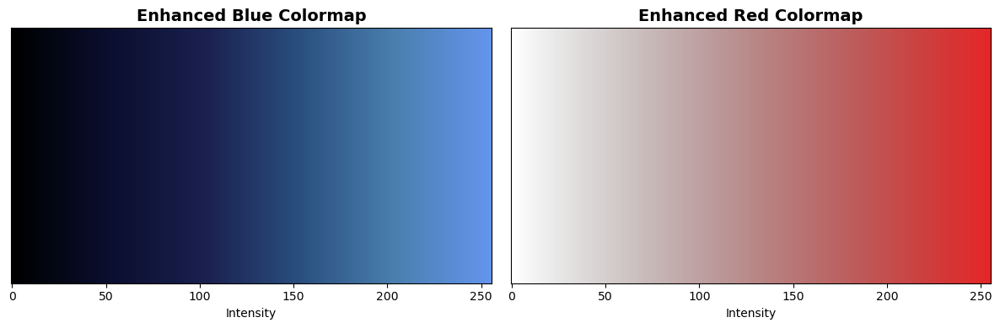

✅ Enhanced colormaps created and displayed!


In [363]:
# IMPROVEMENT 1: Enhanced colormaps for better scientific visualization
def setup_enhanced_colormaps():
    """Setup better colormaps for scientific imaging"""
    
    # Enhanced blue colormap with better contrast
    colors_blue = ['#000000', '#0a0f2e', '#1a1f4e', '#2a4f7e', '#4a7fae', '#6495ed']
    cmap_blue = clr.LinearSegmentedColormap.from_list('enhanced_blue', colors_blue, N=256)
    
    # Enhanced red colormap with proper transparency
    colors_red = [(0.0, 0.0, 0.0, 0.0), (0.9, 0.15, 0.15, 1.0)]
    cmap_red = clr.LinearSegmentedColormap.from_list('enhanced_red', colors_red, N=256)
    
    return cmap_blue, cmap_red

# Test and display the colormaps
cmap_blue, cmap_red = setup_enhanced_colormaps()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

# Show colormaps
gradient = np.linspace(0, 1, 256).reshape(1, -1)
ax1.imshow(gradient, aspect='auto', cmap=cmap_blue)
ax1.set_title('Enhanced Blue Colormap', fontsize=14, fontweight='bold')
ax1.set_xlabel('Intensity')
ax1.set_yticks([])

ax2.imshow(gradient, aspect='auto', cmap=cmap_red)
ax2.set_title('Enhanced Red Colormap', fontsize=14, fontweight='bold') 
ax2.set_xlabel('Intensity')
ax2.set_yticks([])

plt.tight_layout()
plt.show()

print("✅ Enhanced colormaps created and displayed!")


📊 Testing adaptive intensity scaling...
   Blue channel: 387.0 - 609.0
   Red channel: 398.0 - 520.0


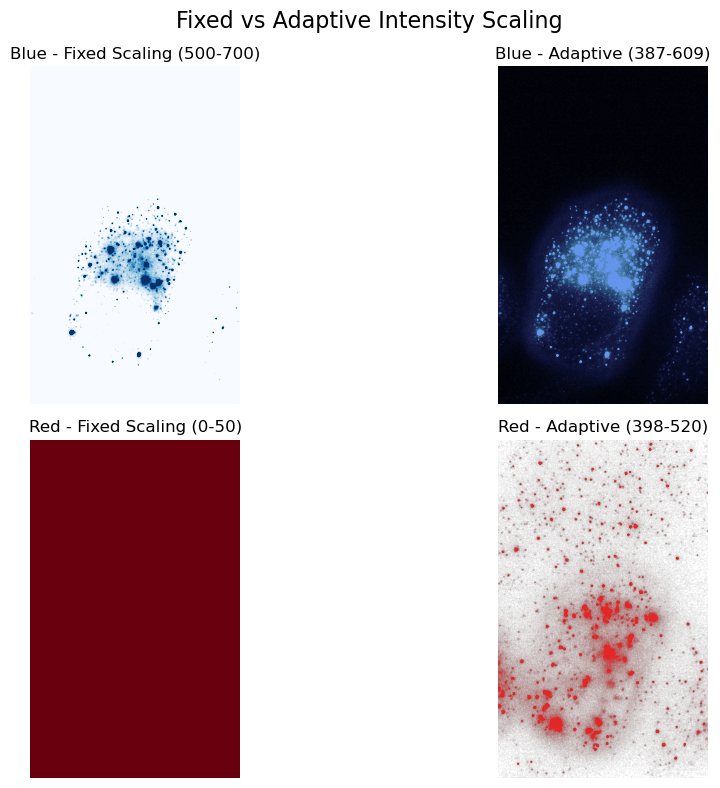

✅ Adaptive scaling tested and displayed!


In [364]:
# IMPROVEMENT 2: Adaptive intensity scaling
def adaptive_intensity_scaling(image, percentile_low=2, percentile_high=98):
    """
    Calculate adaptive intensity scaling based on image statistics
    Much better than hard-coded values!
    """
    non_zero_pixels = image[image > 0]
    if len(non_zero_pixels) > 100:  # Need enough pixels for statistics
        vmin = np.percentile(non_zero_pixels, percentile_low)
        vmax = np.percentile(non_zero_pixels, percentile_high)
    else:
        vmin, vmax = np.min(image), np.max(image)
    return vmin, vmax

# Test adaptive scaling with loaded data
if video is not None:
    print("📊 Testing adaptive intensity scaling...")
    
    test_frame_blue = video[0, 1, :, :]
    test_frame_red = video[0, 0, :, :]
    
    blue_vmin, blue_vmax = adaptive_intensity_scaling(test_frame_blue)
    red_vmin, red_vmax = adaptive_intensity_scaling(test_frame_red)
    
    print(f"   Blue channel: {blue_vmin:.1f} - {blue_vmax:.1f}")
    print(f"   Red channel: {red_vmin:.1f} - {red_vmax:.1f}")
    
    # Show comparison
    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    
    axes[0,0].imshow(test_frame_blue, cmap='Blues', vmin=500, vmax=700)
    axes[0,0].set_title('Blue - Fixed Scaling (500-700)')
    axes[0,0].axis('off')
    
    axes[0,1].imshow(test_frame_blue, cmap=cmap_blue, vmin=blue_vmin, vmax=blue_vmax)
    axes[0,1].set_title(f'Blue - Adaptive ({blue_vmin:.0f}-{blue_vmax:.0f})')
    axes[0,1].axis('off')
    
    axes[1,0].imshow(test_frame_red, cmap='Reds', vmin=0, vmax=50)
    axes[1,0].set_title('Red - Fixed Scaling (0-50)')
    axes[1,0].axis('off')
    
    axes[1,1].imshow(test_frame_red, cmap=cmap_red, vmin=red_vmin, vmax=red_vmax)
    axes[1,1].set_title(f'Red - Adaptive ({red_vmin:.0f}-{red_vmax:.0f})')
    axes[1,1].axis('off')
    
    plt.suptitle('Fixed vs Adaptive Intensity Scaling', fontsize=16)
    plt.tight_layout()
    plt.show()
    
    print("✅ Adaptive scaling tested and displayed!")
else:
    print("❌ No video data available for testing")



🔷 Testing contour parsing...
   Sample: [[302, 670], [301, 671], [301, 672], [301, 673], [302, 673], [303, 673], [304, 673], [304, 672], [30...
   Parsed: 10 points


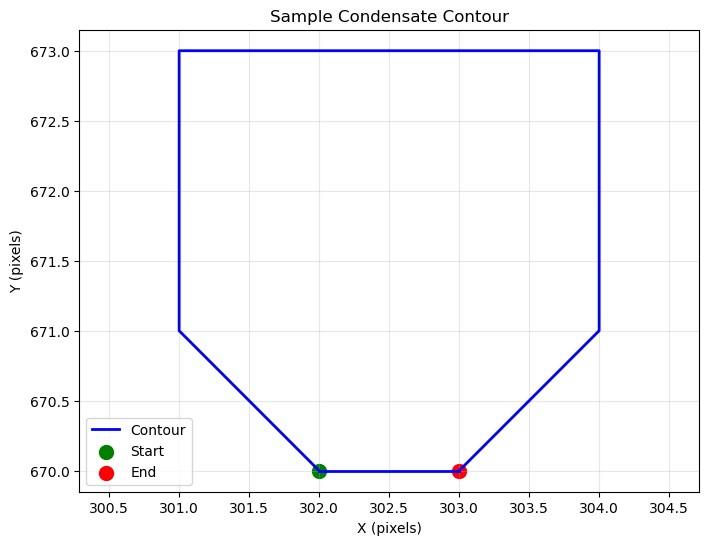

✅ Contour parsing tested and displayed!


In [365]:
# IMPROVEMENT 3: Enhanced contour parsing and visualization  
def parse_contour_string(contour_string):
    """Improved contour string parsing with error handling"""
    try:
        # Your existing function but with better error handling
        list_of_xy_string = contour_string[2:-2].split("], [")
        
        lst_x, lst_y = [], []
        for xy_string in list_of_xy_string:
            try:
                x, y = xy_string.split(", ")
                lst_x.append(float(x))
                lst_y.append(float(y))
            except ValueError:
                continue  # Skip malformed coordinates
                
        return np.array(lst_x), np.array(lst_y)
    except Exception as e:
        print(f"Warning: Could not parse contour: {e}")
        return np.array([]), np.array([])

# Test contour parsing with loaded data
if df_condensates is not None and 'contour_coord' in df_condensates.columns:
    print("🔷 Testing contour parsing...")
    
    test_contour = df_condensates['contour_coord'].iloc[0]
    print(f"   Sample: {str(test_contour)[:100]}...")
    
    x, y = parse_contour_string(test_contour)
    if len(x) > 0:
        print(f"   Parsed: {len(x)} points")
        
        plt.figure(figsize=(8, 6))
        plt.plot(x, y, 'b-', linewidth=2, label='Contour')
        plt.plot([x[-1], x[0]], [y[-1], y[0]], 'b-', linewidth=2)
        plt.scatter(x[0], y[0], c='green', s=100, label='Start')
        plt.scatter(x[-1], y[-1], c='red', s=100, label='End')
        plt.title('Sample Condensate Contour')
        plt.xlabel('X (pixels)')
        plt.ylabel('Y (pixels)')
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.axis('equal')
        plt.show()
        
        print("✅ Contour parsing tested and displayed!")
else:
    print("❌ No condensate data available for testing")


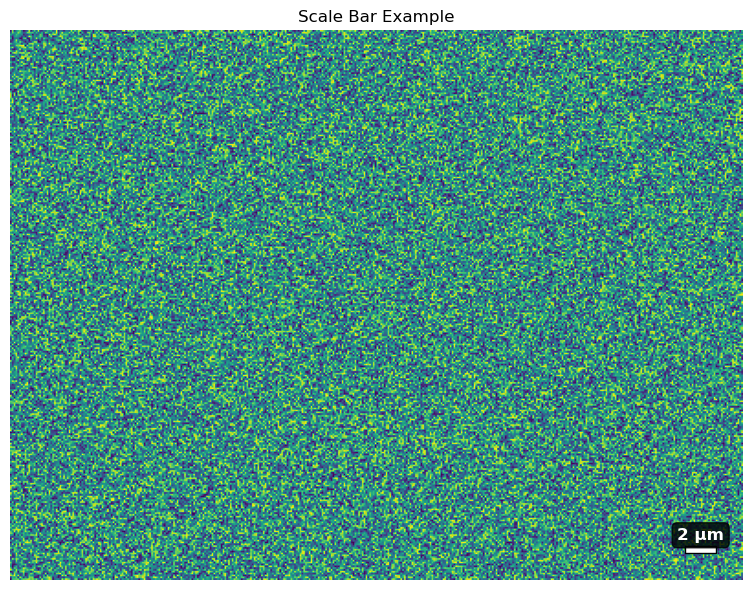

✅ Scale bar function tested and displayed!
   2 μm = 17.1 pixels


In [366]:
# IMPROVEMENT 4: Proper scale bar implementation
def add_scale_bar(ax, image_shape, um_per_pixel=0.117, scalebar_length_um=2.0):
    """Add a proper scale bar to the plot"""
    scalebar_length_pixels = scalebar_length_um / um_per_pixel
    scalebar_thickness = 4
    
    # Position at bottom-right with margin
    margin = 15
    height, width = image_shape
    x_start = width - scalebar_length_pixels - margin
    y_pos = height - margin - scalebar_thickness
    
    # Create scale bar
    scalebar = Rectangle(
        (x_start, y_pos), 
        scalebar_length_pixels, 
        scalebar_thickness,
        facecolor='white',
        edgecolor='black',
        linewidth=1
    )
    ax.add_patch(scalebar)
    
    # Add label
    ax.text(
        x_start + scalebar_length_pixels/2, 
        y_pos - 10,
        f'{scalebar_length_um:.0f} μm',
        ha='center', va='top',
        color='white',
        fontsize=12,
        fontweight='bold',
        bbox=dict(boxstyle='round,pad=0.3', facecolor='black', alpha=0.8)
    )

# Test scale bar
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
test_image = np.random.rand(300, 400) * 1000
ax.imshow(test_image, cmap='viridis')
add_scale_bar(ax, test_image.shape, um_per_pixel, scalebar_length_um=2.0)
ax.set_title('Scale Bar Example')
ax.axis('off')
plt.tight_layout()
plt.show()

print("✅ Scale bar function tested and displayed!")
print(f"   2 μm = {2.0/um_per_pixel:.1f} pixels")



🎯 Testing temporal track visualization...
   Number of tracks: 2029
   Frame range: 0 - 199


/var/folders/8h/0rnws3jn47g7c3skvk66ghh80000gp/T/ipykernel_93063/4176234979.py:53: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_temporal = cm.get_cmap('plasma')


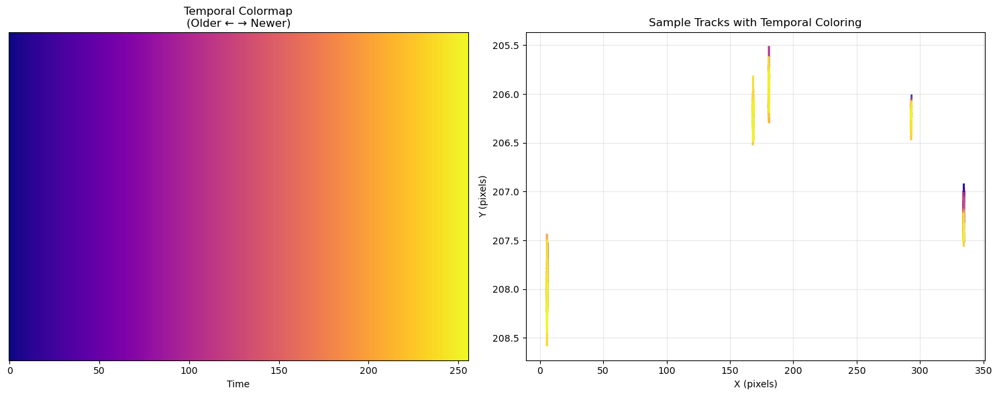

✅ Temporal tracks tested and displayed!


In [367]:
# IMPROVEMENT 5: Temporal track visualization
def create_temporal_tracks(df_tracks, current_frame, max_track_length=15):
    """Create tracks with temporal color coding (recent = brighter)"""
    track_segments = []
    track_ids = df_tracks["trackID"].unique()
    
    # Use a perceptually uniform colormap
    cmap_temporal = cm.get_cmap('plasma')
    
    for track_id in track_ids:
        full_track = df_tracks[df_tracks["trackID"] == track_id]
        track_till_now = full_track[full_track["t"] <= current_frame]
        track_till_now = track_till_now.sort_values("t")
        
        # Only show recent history
        if len(track_till_now) > max_track_length:
            track_till_now = track_till_now.tail(max_track_length)
        
        if len(track_till_now) < 2:
            continue
            
        x_plot = track_till_now["x"].to_numpy(float)
        y_plot = track_till_now["y"].to_numpy(float)
        frame_nums = track_till_now["t"].to_numpy(float)
        
        # Draw segments with temporal coloring
        for i in range(len(x_plot) - 1):
            # Calculate color weight (more recent = higher value)
            age = current_frame - frame_nums[i+1]
            time_weight = max(0, 1 - age / max_track_length)
            
            segment_info = {
                'x': [x_plot[i], x_plot[i+1]],
                'y': [y_plot[i], y_plot[i+1]],
                'color': cmap_temporal(time_weight),
                'alpha': 0.4 + 0.6 * time_weight,
                'linewidth': 0.5 + 1.0 * time_weight 
            }
            track_segments.append(segment_info)
    
    return track_segments

# Test temporal tracks with converted data
if df_tracks is not None:
    print("\n🎯 Testing temporal track visualization...")
    print(f"   Number of tracks: {df_tracks['trackID'].nunique()}")
    print(f"   Frame range: {df_tracks['t'].min()} - {df_tracks['t'].max()}")
    
    # Demo temporal coloring
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # Show colormap
    cmap_temporal = cm.get_cmap('plasma')
    gradient = np.linspace(0, 1, 256).reshape(1, -1)
    ax1.imshow(gradient, aspect='auto', cmap=cmap_temporal)
    ax1.set_title('Temporal Colormap\n(Older ← → Newer)')
    ax1.set_xlabel('Time')
    ax1.set_yticks([])
    
    # Show sample tracks
    sample_tracks = df_tracks['trackID'].unique()[:5]
    for track_id in sample_tracks:
        track_data = df_tracks[df_tracks['trackID'] == track_id].sort_values('t')
        if len(track_data) > 1:
            x = track_data['x'].values
            y = track_data['y'].values
            times = track_data['t'].values
            time_norm = (times - times.min()) / (times.max() - times.min() + 1e-6)
            
            for i in range(len(x)-1):
                color = cmap_temporal(time_norm[i+1])
                ax2.plot([x[i], x[i+1]], [y[i], y[i+1]], 
                        color=color, linewidth=2, alpha=0.8)
    
    ax2.set_title('Sample Tracks with Temporal Coloring')
    ax2.set_xlabel('X (pixels)')
    ax2.set_ylabel('Y (pixels)')
    ax2.grid(True, alpha=0.3)
    ax2.invert_yaxis()  # Invert Y-axis for image coordinates
    
    plt.tight_layout()
    plt.show()
    
    print("✅ Temporal tracks tested and displayed!")
else:
    print("❌ No track data available for testing")

Output()

/var/folders/8h/0rnws3jn47g7c3skvk66ghh80000gp/T/ipykernel_93063/4176234979.py:8: MatplotlibDeprecationWarning: The
get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` 
or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_temporal = cm.get_cmap('plasma')

🎬 Creating enhanced frames...
Processing 5 frames...


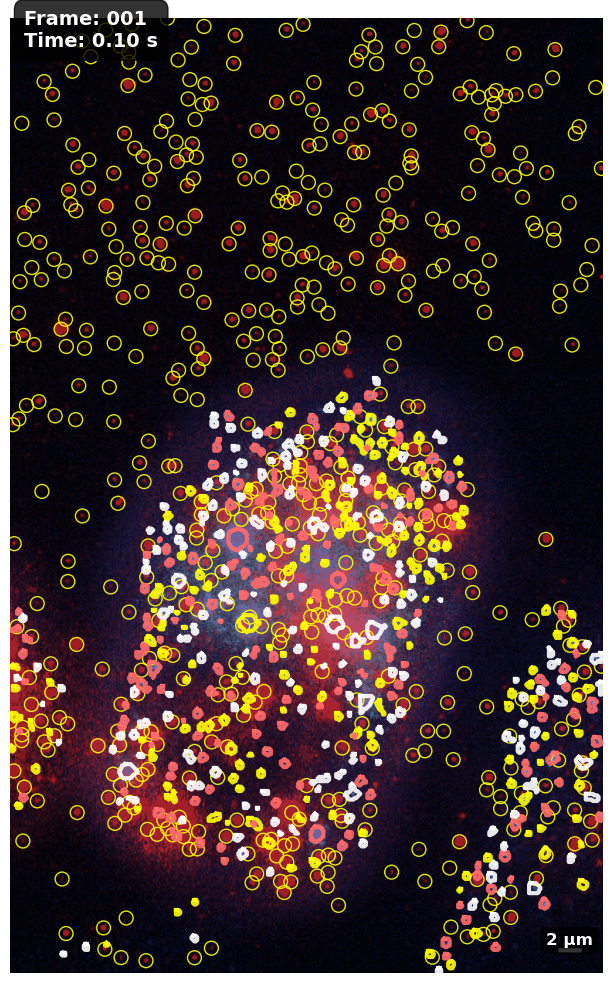

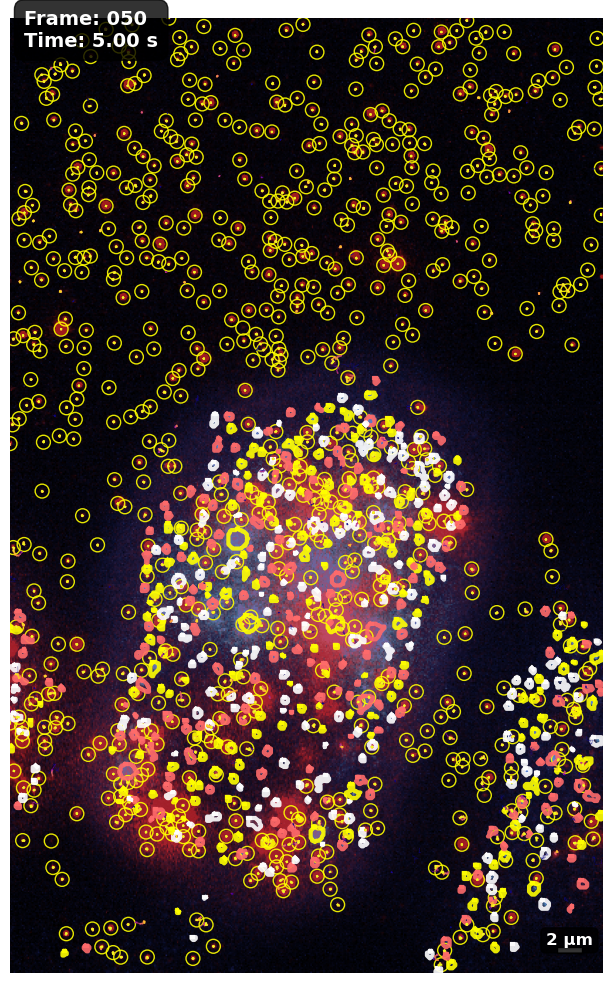

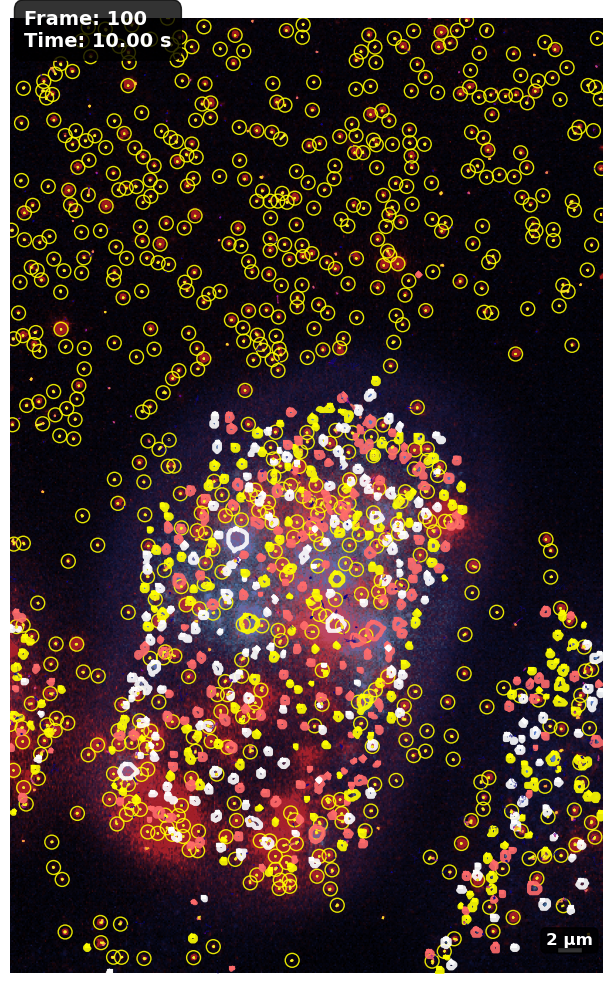

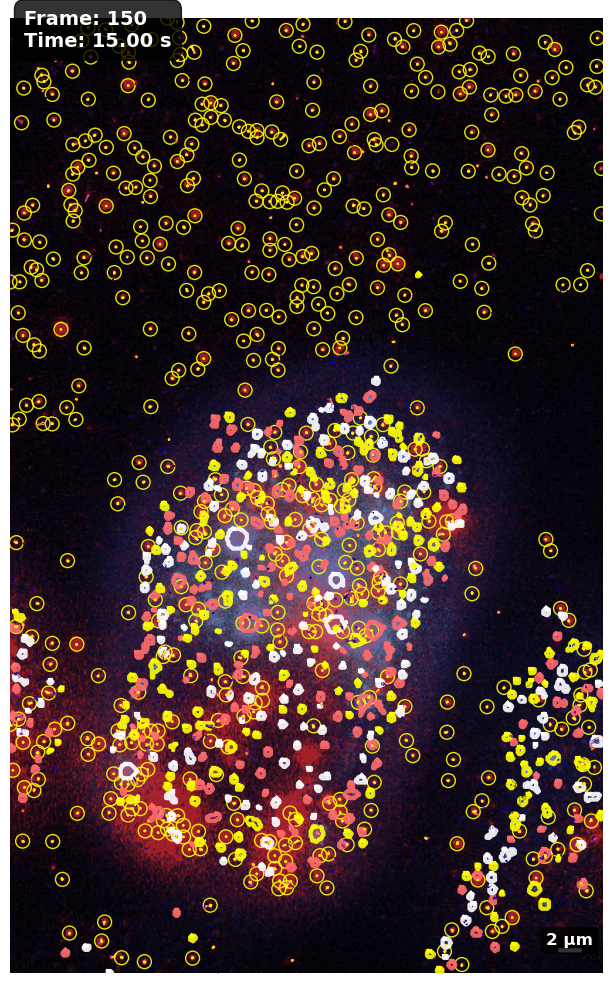

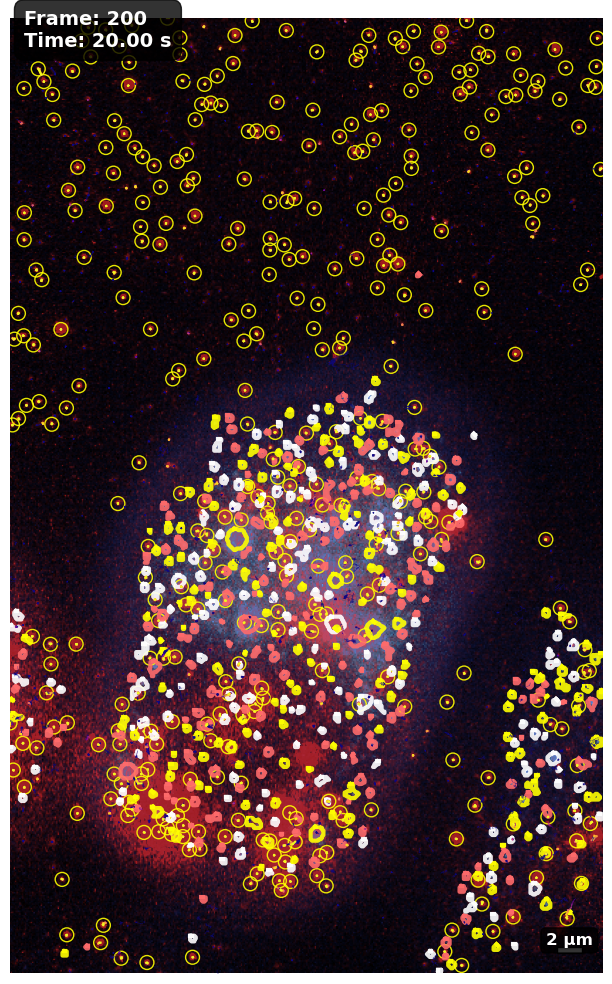

✅ Enhanced frames created and displayed!


In [368]:
# IMPROVEMENT 6: Enhanced visualization - Direct execution
print("🎬 Creating enhanced frames...")

if video is not None and df_tracks is not None and df_condensates is not None:
    # Setup enhanced colormaps
    cmap_blue, cmap_red = setup_enhanced_colormaps()
    
    # Select frames - you can modify this selection strategy
    frame_indices = np.linspace(1, min(200, video.shape[0]), 5, dtype=int)  # Reduced to 5 frames for testing
    
    print(f"Processing {len(frame_indices)} frames...")
    for frame in track(frame_indices):
        img_blue = video[frame - 1, 1, :, :]
        img_red = video[frame - 1, 0, :, :]
        
        # Create figure with better sizing
        fig, ax = plt.subplots(1, 1, figsize=(12, 10))
        
        # ADAPTIVE INTENSITY SCALING (instead of hard-coded values)
        blue_vmin, blue_vmax = adaptive_intensity_scaling(img_blue, 2, 98)
        red_vmin, red_vmax = adaptive_intensity_scaling(img_red, 1, 95)
        
        # Display images with enhanced colormaps
        ax.imshow(img_blue, cmap=cmap_blue, vmin=blue_vmin, vmax=blue_vmax)
        ax.imshow(img_red, cmap=cmap_red, vmin=red_vmin, vmax=red_vmax, alpha=0.7)
        
        # Enhanced contour visualization
        contours = df_condensates[df_condensates["frame"] == frame - 1]["contour_coord"].to_list()
        contour_colors = ['#ffffff', '#ffff00', '#ff6b6b']  # white, yellow, coral
        
        for i, cnt in enumerate(contours):
            x, y = parse_contour_string(cnt)
            if len(x) > 0:  # Only plot if we have valid coordinates
                color = contour_colors[i % len(contour_colors)]
                ax.plot(x, y, lw=3, c=color, alpha=0.9)
                ax.plot([x[-1], x[0]], [y[-1], y[0]], c=color, lw=3, alpha=0.9)
        
        # Enhanced track visualization with temporal coloring
        all_available_frames = set(df_tracks["t"].unique())
        if frame - 1 in all_available_frames:
            # Current particle positions
            current_x = df_tracks[df_tracks["t"] == frame - 1]["x"].to_numpy()
            current_y = df_tracks[df_tracks["t"] == frame - 1]["y"].to_numpy()
            ax.scatter(
                current_x, current_y,
                marker='o', s=100,
                facecolors='none',
                edgecolors='yellow',
                linewidths=1,
                alpha=0.9
            )
            
            # Temporal tracks
            track_segments = create_temporal_tracks(df_tracks, frame - 1)
            for segment in track_segments:
                ax.plot(
                    segment['x'], segment['y'],
                    color=segment['color'],
                    alpha=segment['alpha'],
                    linewidth=segment['linewidth']
                )
        
        # Enhanced time display
        time_seconds = frame * s_per_frame
        ax.text(
            10, 20,
            f'Frame: {frame:03d}\nTime: {time_seconds:.2f} s',
            fontsize=14,
            color='white',
            fontweight='bold',
            bbox=dict(boxstyle='round,pad=0.5', facecolor='black', alpha=0.8)
        )
        
        # Add proper scale bar
        add_scale_bar(ax, img_blue.shape, um_per_pixel)
        
        # Set proper display parameters
        ax.set_xlim(0, img_blue.shape[1])
        ax.set_ylim(img_blue.shape[0], 0)  # Invert y-axis
        ax.set_aspect('equal')
        ax.axis("off")
        
        plt.tight_layout()
        
        # Save with better parameters
        plt.savefig(
            f"enhanced_img_{frame:03d}.png",
            format="png",
            bbox_inches="tight",
            dpi=300,
            facecolor='black'  # Better for scientific images
        )
        plt.show()  # Display in notebook
        plt.close()  # Prevent memory buildup
    
    print("✅ Enhanced frames created and displayed!")
else:
    print("❌ Cannot create frames - missing data!")


Output()

/var/folders/8h/0rnws3jn47g7c3skvk66ghh80000gp/T/ipykernel_93063/4176234979.py:8: MatplotlibDeprecationWarning: The
get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` 
or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_temporal = cm.get_cmap('plasma')

🎯 Creating track-only frames...
Processing 11 frames...


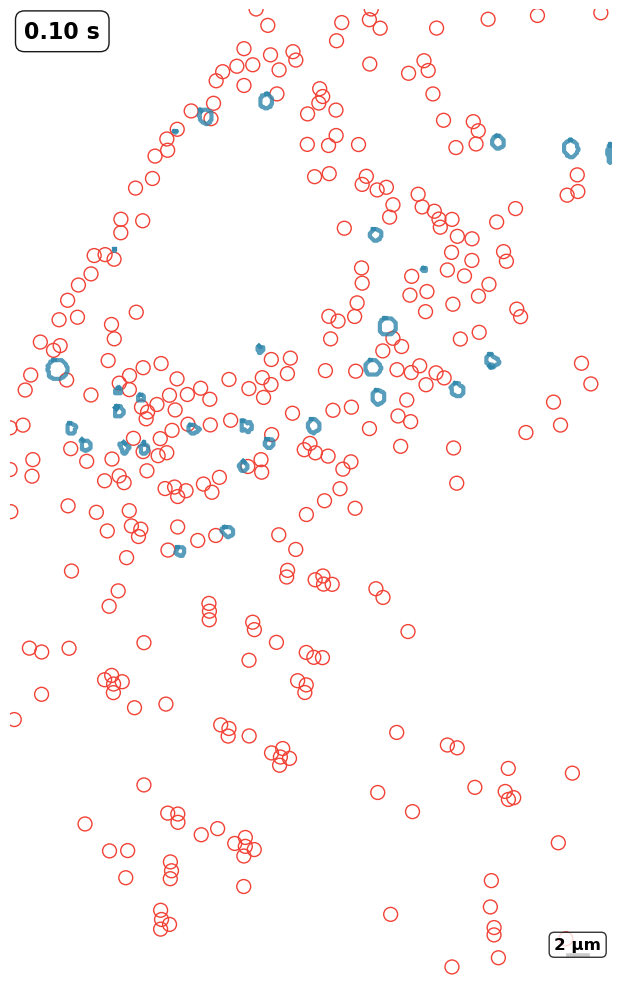

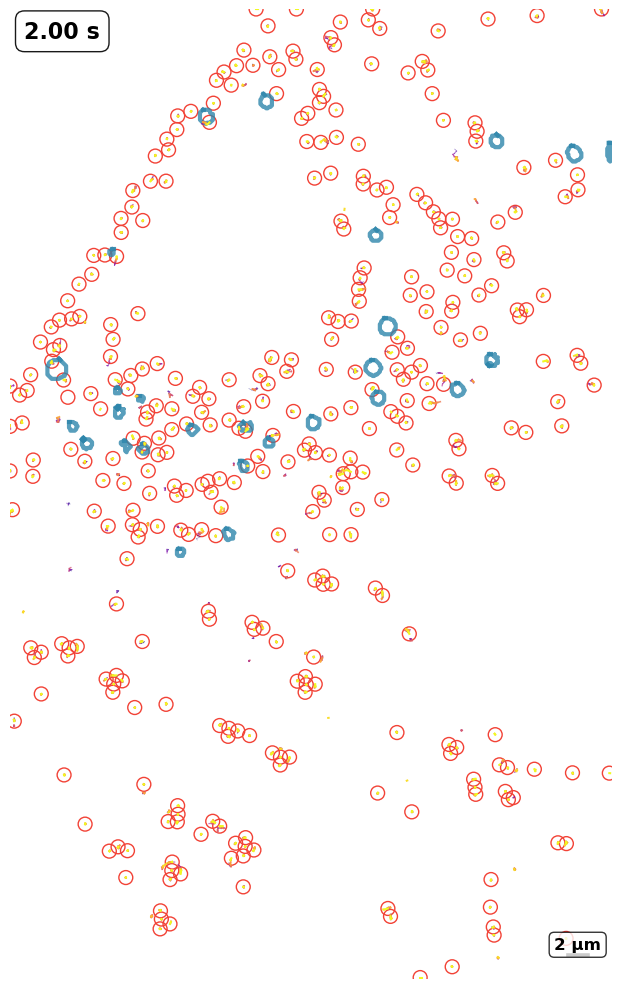

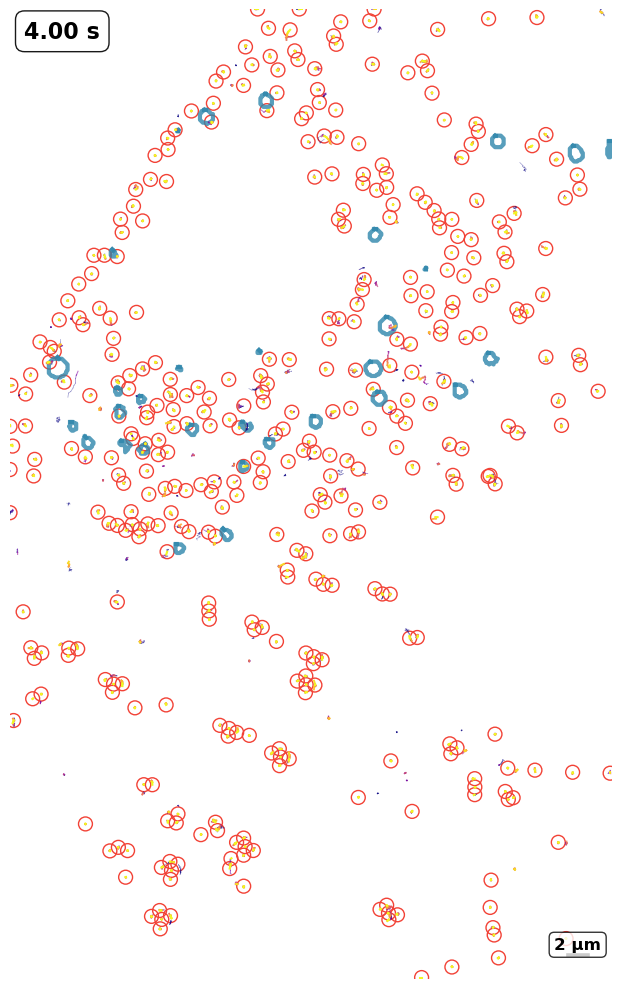

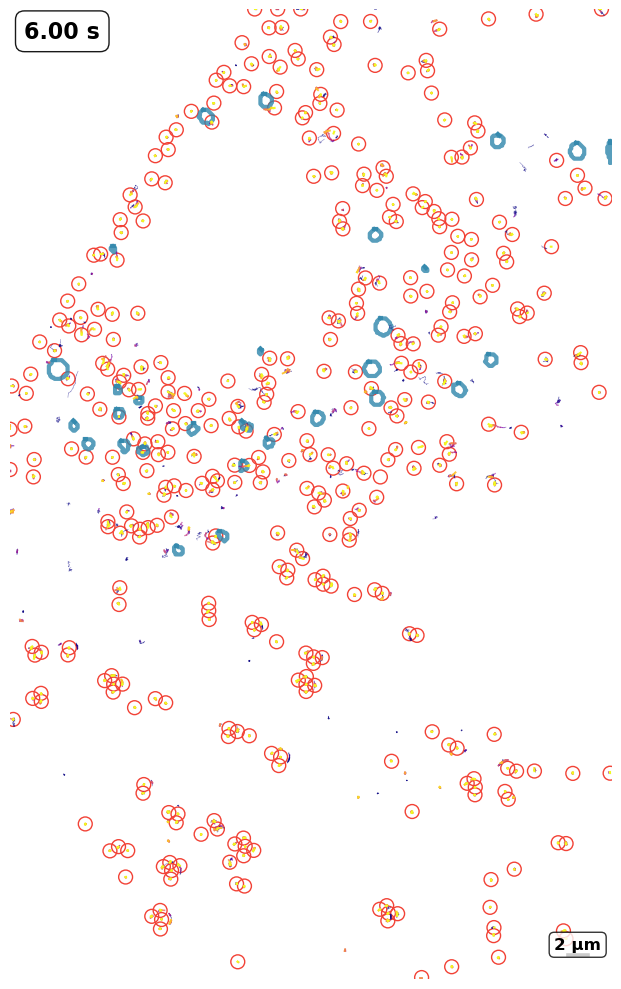

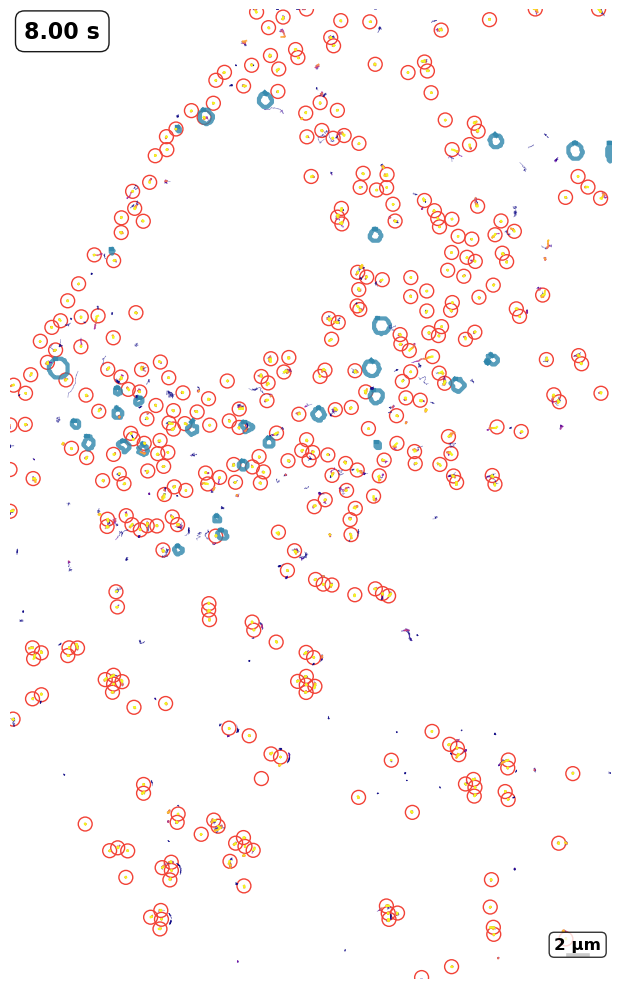

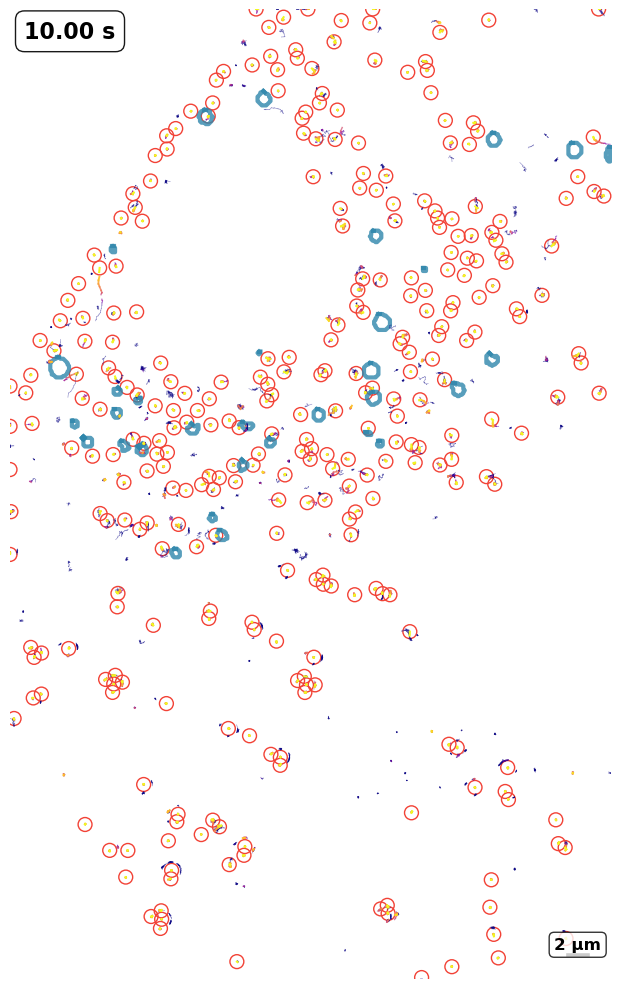

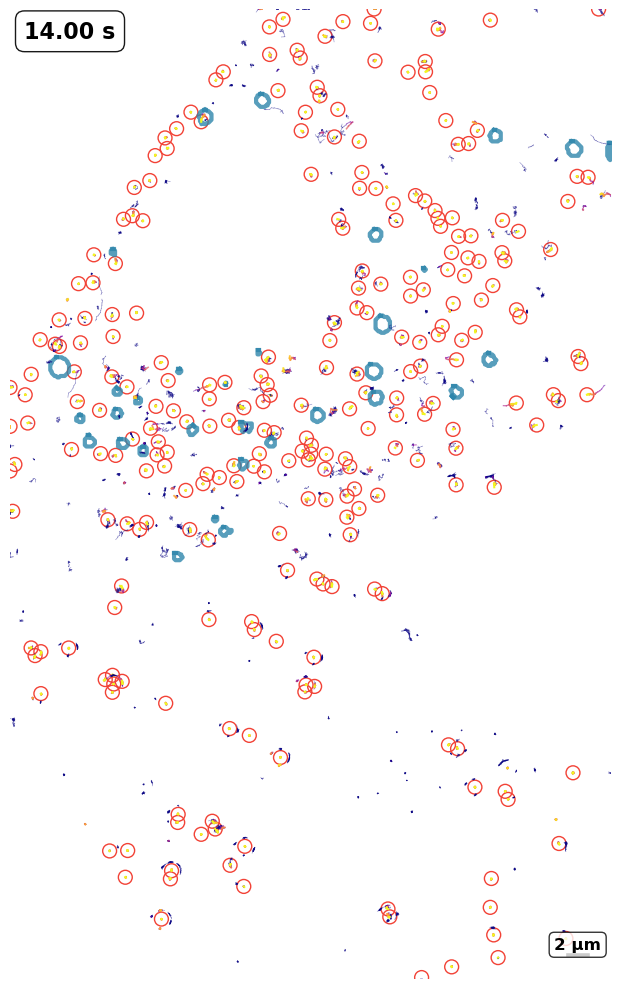

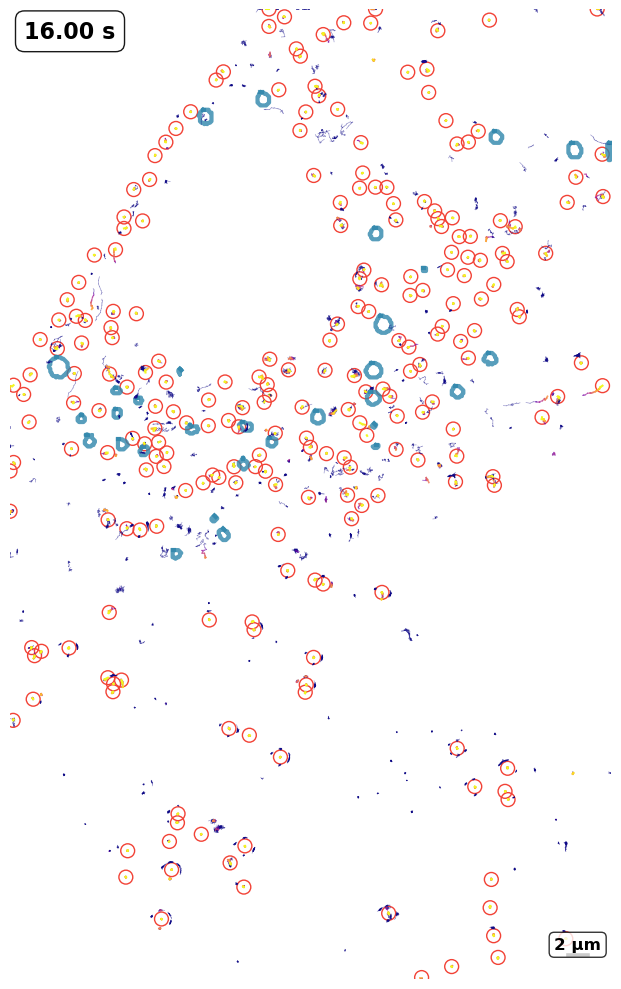

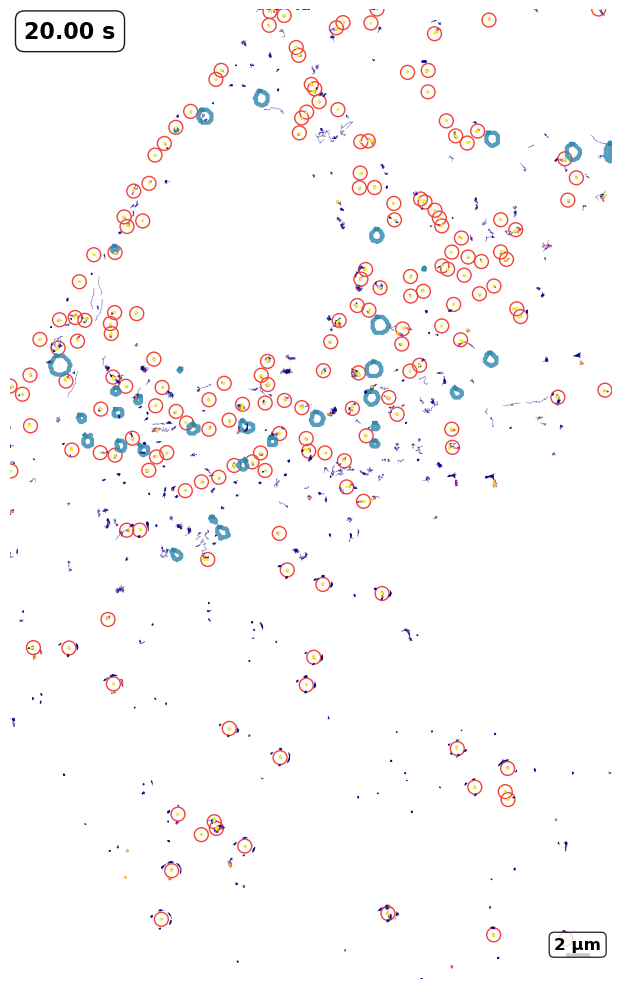

✅ Track-only frames created and displayed!


In [ ]:
# IMPROVEMENT 7: Track-only visualization - Direct execution
print("🎯 Creating track-only frames...")

if video is not None and df_tracks is not None and df_condensates is not None:
    frame_indices = np.linspace(1, min(200, video.shape[0]), 5, dtype=int)  # Reduced to 5 frames
    
    print(f"Processing {len(frame_indices)} frames...")
    for frame in track(frame_indices):
        img_blue = video[frame - 1, 1, :, :]
        
        fig, ax = plt.subplots(1, 1, figsize=(12, 10))
        
        # Enhanced contours
        contours = df_condensates[df_condensates["frame"] == frame - 1]["contour_coord"].to_list()
        for cnt in contours:
            x, y = parse_contour_string(cnt)
            if len(x) > 0:
                ax.plot(x, y, lw=3, c="#2E86AB", alpha=0.8)  # Professional blue
                ax.plot([x[-1], x[0]], [y[-1], y[0]], c="#2E86AB", lw=3, alpha=0.8)
        
        # Current particles and temporal tracks
        all_available_frames = set(df_tracks["t"].unique())
        if frame - 1 in all_available_frames:
            current_x = df_tracks[df_tracks["t"] == frame - 1]["x"].to_numpy()
            current_y = df_tracks[df_tracks["t"] == frame - 1]["y"].to_numpy()
            ax.scatter(
                current_x, current_y,
                marker='o', s=100,
                facecolors='none',
                edgecolors='#F24236',  # Professional red
                linewidths=1
            )
            
            # Enhanced temporal tracks
            track_segments = create_temporal_tracks(df_tracks, frame - 1)
            for segment in track_segments:
                ax.plot(
                    segment['x'], segment['y'],
                    color=segment['color'],
                    alpha=segment['alpha'],
                    linewidth=segment['linewidth']
                )
        
        # Professional time display
        time_seconds = frame * s_per_frame
        ax.text(
            10, 20,
            f'{time_seconds:.2f} s',
            fontsize=16,
            color='black',
            fontweight='bold',
            bbox=dict(boxstyle='round,pad=0.4', facecolor='white', alpha=0.9)
        )
        
        # Add scale bar (modified for white background)
        scalebar_length_pixels = 2.0 / um_per_pixel
        scalebar_thickness = 4
        margin = 15
        height, width = img_blue.shape
        x_start = width - scalebar_length_pixels - margin
        y_pos = height - margin - scalebar_thickness
        
        scalebar = Rectangle(
            (x_start, y_pos), scalebar_length_pixels, scalebar_thickness,
            facecolor='black', edgecolor='white', linewidth=1
        )
        ax.add_patch(scalebar)
        
        ax.text(
            x_start + scalebar_length_pixels/2, y_pos - 10, '2 μm',
            ha='center', va='top', color='black', fontsize=12, fontweight='bold',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8)
        )
        
        ax.set_xlim(0, img_blue.shape[1])
        ax.set_ylim(img_blue.shape[0], 0)
        ax.set_aspect('equal')
        ax.axis("off")
        
        plt.tight_layout()

        plt.savefig(
            f"enhanced_track_{frame:03d}.png",
            format="png",
            bbox_inches="tight",
            dpi=300,
            facecolor='white'
        )
        plt.show()  # Display in notebook
        plt.close()
    
    print("✅ Track-only frames created and displayed!")
else:
    print("❌ Cannot create frames - missing data!")


🎯 Creating final track-only reconstruction frame (no localization circles)...


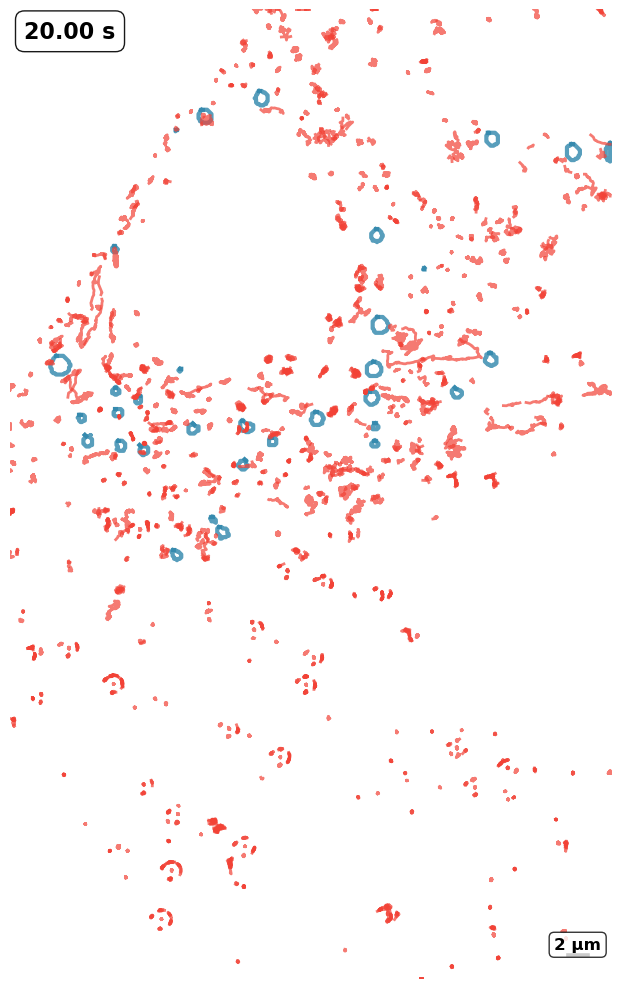

✅ Final track-only reconstruction created without localization circles!


In [355]:
# FINAL RECONSTRUCTION: Based on IMPROVEMENT 7 style - Last frame with full trajectories, NO circles
print("🎯 Creating final track-only reconstruction frame (no localization circles)...")

from matplotlib.patches import Rectangle

if video is not None and df_tracks is not None and df_condensates is not None:
    
    # Get the final frame
    final_frame = int(df_tracks['t'].max()) + 1  # +1 to match your 1-based indexing
    
    # Extract blue channel for dimensions and scale reference
    img_blue = video[final_frame - 1, 1, :, :]
    
    fig, ax = plt.subplots(1, 1, figsize=(12, 10))
    
    # Enhanced contours (same style as IMPROVEMENT 7)
    contours = df_condensates[df_condensates["frame"] == final_frame - 1]["contour_coord"].to_list()
    for cnt in contours:
        x, y = parse_contour_string(cnt)
        if len(x) > 0:
            ax.plot(x, y, lw=3, c="#2E86AB", alpha=0.8)  # Professional blue
            ax.plot([x[-1], x[0]], [y[-1], y[0]], c="#2E86AB", lw=3, alpha=0.8)
    
    # FULL TRAJECTORIES instead of temporal segments (NO localization circles)
    all_available_frames = set(df_tracks["t"].unique())
    if final_frame - 1 in all_available_frames or len(all_available_frames) > 0:
        
        # Plot complete trajectories for each track up to final frame
        track_ids = df_tracks['trackID'].unique()
        
        for track_id in track_ids:
            # Get full track data up to final frame
            full_track_data = df_tracks[
                (df_tracks['trackID'] == track_id) & 
                (df_tracks['t'] <= final_frame - 1)
            ].sort_values('t')
            
            if len(full_track_data) > 1:  # Only plot tracks with multiple points
                ax.plot(
                    full_track_data['x'], full_track_data['y'],
                    color='#F24236',  # Professional red (same as your circles)
                    alpha=0.7,
                    linewidth=2
                )
        
        # **NO LOCALIZATION CIRCLES** - This section is completely removed
        # The scatter plot from your original code is omitted here
    
    # Professional time display (same style as IMPROVEMENT 7)
    time_seconds = final_frame * s_per_frame
    ax.text(
        10, 20,
        f'{time_seconds:.2f} s',
        fontsize=16,
        color='black',
        fontweight='bold',
        bbox=dict(boxstyle='round,pad=0.4', facecolor='white', alpha=0.9)
    )
    
    # Add scale bar (same style as IMPROVEMENT 7)
    scalebar_length_pixels = 2.0 / um_per_pixel
    scalebar_thickness = 4
    margin = 15
    height, width = img_blue.shape
    x_start = width - scalebar_length_pixels - margin
    y_pos = height - margin - scalebar_thickness
    
    scalebar = Rectangle(
        (x_start, y_pos), scalebar_length_pixels, scalebar_thickness,
        facecolor='black', edgecolor='white', linewidth=1
    )
    ax.add_patch(scalebar)
    
    ax.text(
        x_start + scalebar_length_pixels/2, y_pos - 10, '2 μm',
        ha='center', va='top', color='black', fontsize=12, fontweight='bold',
        bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8)
    )
    
    # Set display parameters (same as IMPROVEMENT 7)
    ax.set_xlim(0, img_blue.shape[1])
    ax.set_ylim(img_blue.shape[0], 0)
    ax.set_aspect('equal')
    ax.axis("off")
    
    plt.tight_layout()
    
    # Save with same parameters as IMPROVEMENT 7
    plt.savefig(
        f"final_reconstruction_no_circles_{final_frame:03d}.png",
        format="png",
        bbox_inches="tight",
        dpi=300,
        facecolor='white'
    )
    plt.show()  # Display in notebook
    plt.close()
    
    print("✅ Final track-only reconstruction created without localization circles!")
else:
    print("❌ Cannot create final reconstruction - missing data!")


🎯 Creating final reconstruction with ONLY interacting tracks...
Analyzing 1282 tracks for boundary interactions...
✅ Found 214 tracks interacting with condensate boundaries


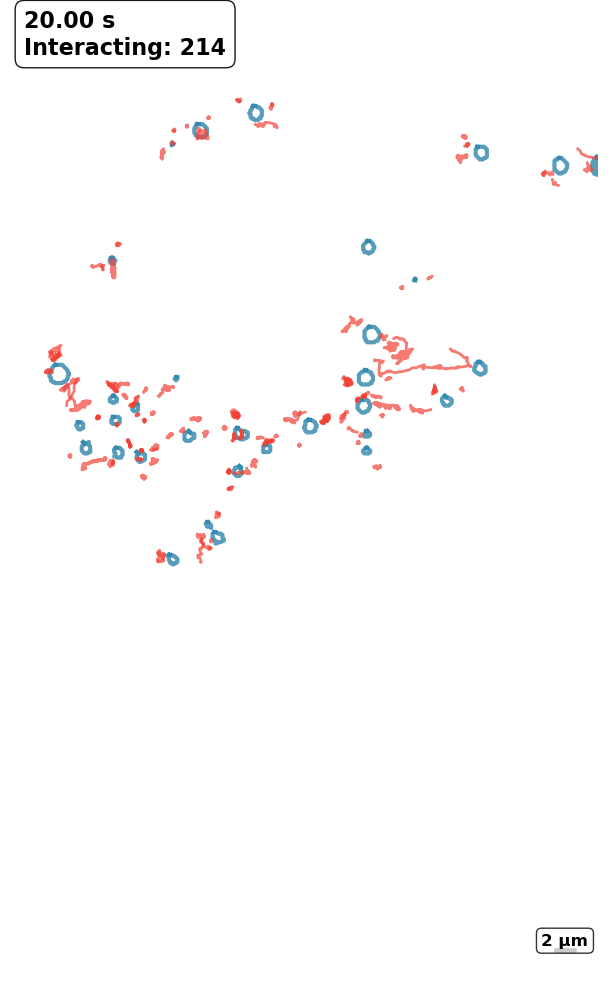

✅ Final reconstruction with interacting tracks saved!


In [358]:
# FINAL RECONSTRUCTION: Only tracks interacting with condensate boundaries
print("🎯 Creating final reconstruction with ONLY interacting tracks...")

from matplotlib.patches import Rectangle
import numpy as np

if video is not None and df_tracks is not None and df_condensates is not None:
    
    # Get the final frame
    final_frame = int(df_tracks['t'].max()) + 1
    
    # Extract blue channel for dimensions
    img_blue = video[final_frame - 1, 1, :, :]
    height, width = img_blue.shape
    
    # Helper function to get parsed contours
    def get_contour_coords(df_condensates, frame):
        """Parse and return list of (x_coords, y_coords) tuples for each condensate"""
        contours = df_condensates[df_condensates["frame"] == frame]["contour_coord"].to_list()
        parsed_contours = []
        for cnt in contours:
            x, y = parse_contour_string(cnt)
            if len(x) > 0:
                parsed_contours.append((np.array(x), np.array(y)))
        return parsed_contours
    
    # Get condensate boundaries for final frame
    contour_boundaries = get_contour_coords(df_condensates, final_frame - 1)
    
    # Function to check if a point is near any condensate boundary
    def is_point_near_boundary(x, y, boundaries, threshold=0):
        """Check if point (x,y) is within threshold distance of any boundary"""
        for cx, cy in boundaries:
            distances = np.sqrt((cx - x)**2 + (cy - y)**2)
            if np.any(distances <= threshold):
                return True
        return False
    
    # Identify tracks that interact with condensate boundaries
    interacting_track_ids = set()
    track_ids = df_tracks['trackID'].unique()
    
    print(f"Analyzing {len(track_ids)} tracks for boundary interactions...")
    
    for track_id in track_ids:
        # Get all points for this track
        track_data = df_tracks[
            (df_tracks['trackID'] == track_id) & 
            (df_tracks['t'] <= final_frame - 1)
        ].sort_values('t')
        
        # Check if any point in the track is near a boundary
        for _, point in track_data.iterrows():
            if is_point_near_boundary(point['x'], point['y'], contour_boundaries, threshold=10):
                interacting_track_ids.add(track_id)
                break  # Found interaction, no need to check more points
    
    print(f"✅ Found {len(interacting_track_ids)} tracks interacting with condensate boundaries")
    
    # Create the final reconstruction plot
    fig, ax = plt.subplots(1, 1, figsize=(12, 10))
    
    # Plot condensate boundaries (same style as original)
    for cx, cy in contour_boundaries:
        ax.plot(cx, cy, lw=3, c="#2E86AB", alpha=0.8)  # Professional blue
        ax.plot([cx[-1], cx[0]], [cy[-1], cy[0]], c="#2E86AB", lw=3, alpha=0.8)
    
    # Plot ONLY interacting tracks
    for track_id in interacting_track_ids:
        full_track_data = df_tracks[
            (df_tracks['trackID'] == track_id) & 
            (df_tracks['t'] <= final_frame - 1)
        ].sort_values('t')
        
        if len(full_track_data) > 1:  # Only plot tracks with multiple points
            ax.plot(
                full_track_data['x'], full_track_data['y'],
                color='#F24236',  # Professional red
                alpha=0.7,
                linewidth=2
            )
    
    # Add interaction count to time display
    time_seconds = final_frame * s_per_frame
    ax.text(
        10, 20,
        f'{time_seconds:.2f} s\nInteracting: {len(interacting_track_ids)}',
        fontsize=16,
        color='black',
        fontweight='bold',
        bbox=dict(boxstyle='round,pad=0.4', facecolor='white', alpha=0.9)
    )
    
    # Add scale bar (same style as original)
    scalebar_length_pixels = 2.0 / um_per_pixel
    scalebar_thickness = 4
    margin = 15
    x_start = width - scalebar_length_pixels - margin
    y_pos = height - margin - scalebar_thickness
    
    scalebar = Rectangle(
        (x_start, y_pos), scalebar_length_pixels, scalebar_thickness,
        facecolor='black', edgecolor='white', linewidth=1
    )
    ax.add_patch(scalebar)
    
    ax.text(
        x_start + scalebar_length_pixels/2, y_pos - 10, '2 μm',
        ha='center', va='top', color='black', fontsize=12, fontweight='bold',
        bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8)
    )
    
    # Set display parameters
    ax.set_xlim(0, width)
    ax.set_ylim(height, 0)
    ax.set_aspect('equal')
    ax.axis("off")
    
    # PROPER SAVING ORDER
    plt.tight_layout()
    plt.savefig(
        f"final_reconstruction_interacting_only_{final_frame:03d}.png",
        format="png",
        bbox_inches="tight",
        dpi=300,
        facecolor='white',
        edgecolor='none'
    )
    plt.show()
    plt.close()
    
    print(f"✅ Final reconstruction with interacting tracks saved!")
    
else:
    print("❌ Cannot create reconstruction - missing data!")


🔍 Creating zoomed images for each condensate with interacting RNAs...
Processing 507 condensates...
   Condensate 1: No interacting RNAs found, skipping...
   Condensate 2: No interacting RNAs found, skipping...
   Condensate 3: No interacting RNAs found, skipping...
   Condensate 4: No interacting RNAs found, skipping...
   Condensate 5: No interacting RNAs found, skipping...
   Condensate 6: No interacting RNAs found, skipping...
   Condensate 7: No interacting RNAs found, skipping...
   Condensate 8: No interacting RNAs found, skipping...
   Condensate 9: No interacting RNAs found, skipping...
   Condensate 10: No interacting RNAs found, skipping...
   Condensate 11: No interacting RNAs found, skipping...
   Condensate 12: No interacting RNAs found, skipping...
   Condensate 13: No interacting RNAs found, skipping...
   Condensate 14: No interacting RNAs found, skipping...
   Condensate 15: No interacting RNAs found, skipping...
   Condensate 16: No interacting RNAs found, skipping.

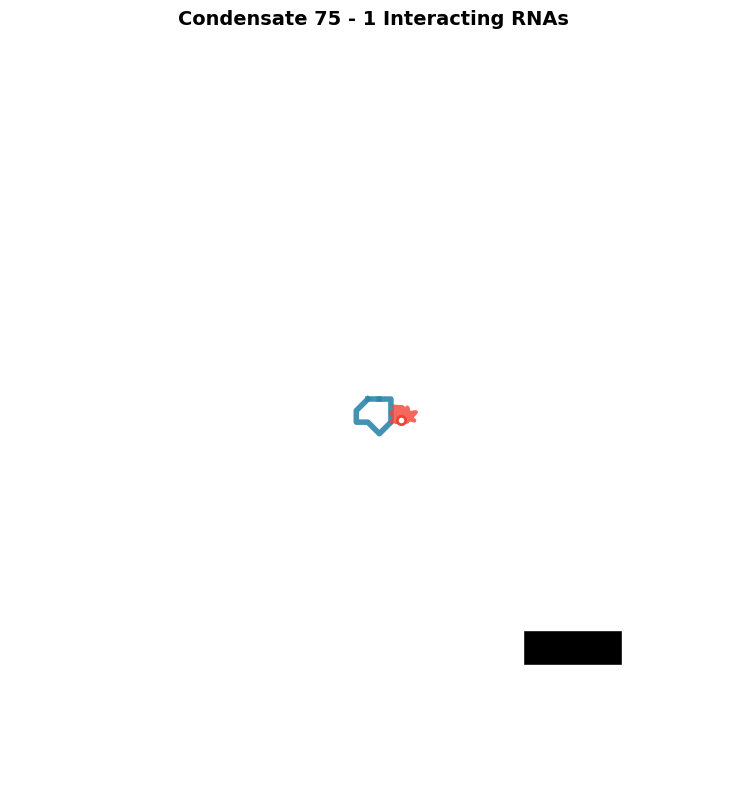

   ✅ Saved zoomed image for Condensate 75
   Condensate 76: No interacting RNAs found, skipping...
   Condensate 77: No interacting RNAs found, skipping...
   Condensate 78: No interacting RNAs found, skipping...
   Condensate 79: Found 1 interacting tracks


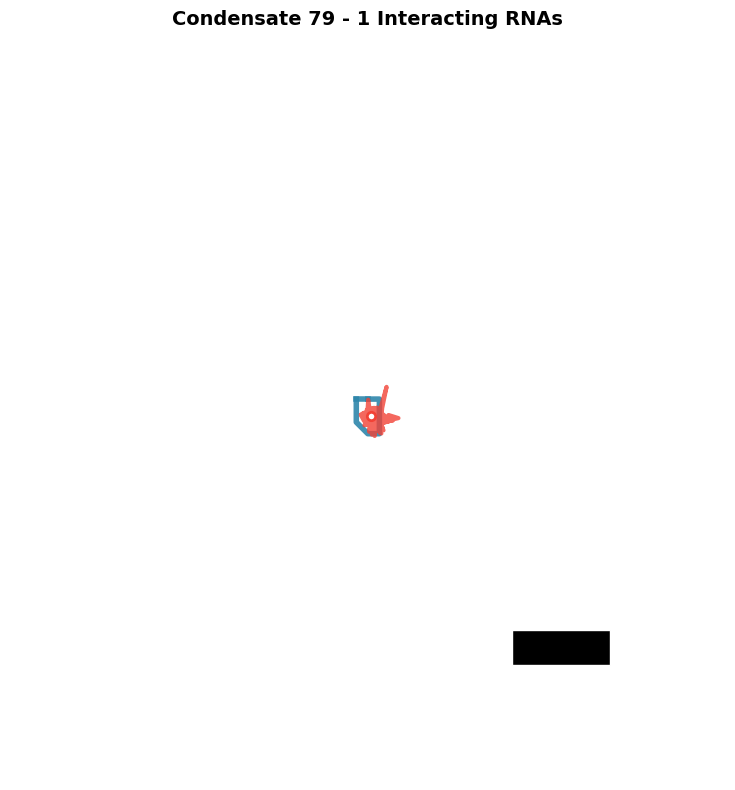

   ✅ Saved zoomed image for Condensate 79
   Condensate 80: No interacting RNAs found, skipping...
   Condensate 81: No interacting RNAs found, skipping...
   Condensate 82: No interacting RNAs found, skipping...
   Condensate 83: No interacting RNAs found, skipping...
   Condensate 84: No interacting RNAs found, skipping...
   Condensate 85: No interacting RNAs found, skipping...
   Condensate 86: No interacting RNAs found, skipping...
   Condensate 87: No interacting RNAs found, skipping...
   Condensate 88: No interacting RNAs found, skipping...
   Condensate 89: No interacting RNAs found, skipping...
   Condensate 90: No interacting RNAs found, skipping...
   Condensate 91: No interacting RNAs found, skipping...
   Condensate 92: No interacting RNAs found, skipping...
   Condensate 93: No interacting RNAs found, skipping...
   Condensate 94: No interacting RNAs found, skipping...
   Condensate 95: No interacting RNAs found, skipping...
   Condensate 96: No interacting RNAs found, s

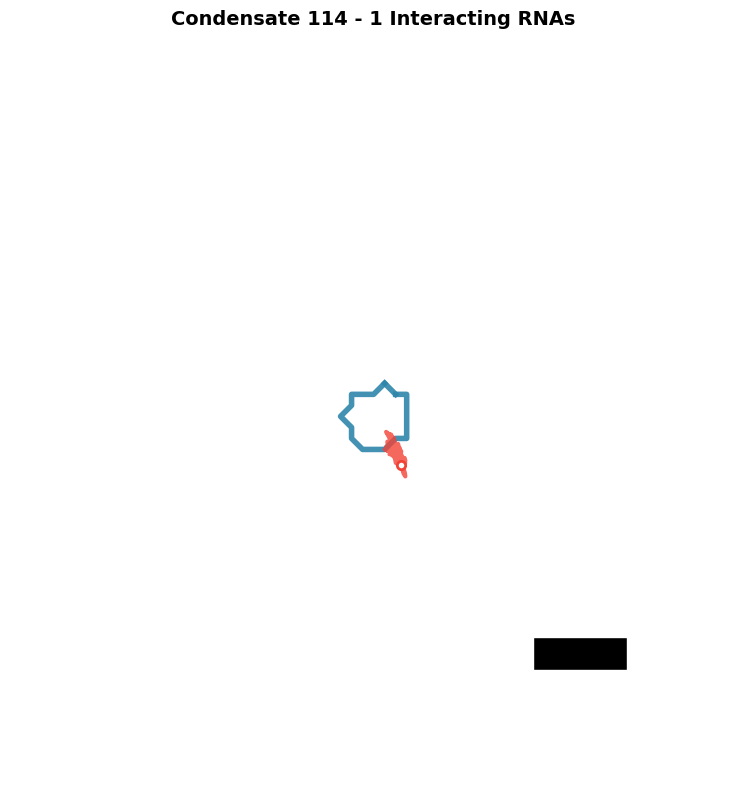

   ✅ Saved zoomed image for Condensate 114
   Condensate 115: No interacting RNAs found, skipping...
   Condensate 116: No interacting RNAs found, skipping...
   Condensate 117: No interacting RNAs found, skipping...
   Condensate 118: No interacting RNAs found, skipping...
   Condensate 119: No interacting RNAs found, skipping...
   Condensate 120: No interacting RNAs found, skipping...
   Condensate 121: No interacting RNAs found, skipping...
   Condensate 122: No interacting RNAs found, skipping...
   Condensate 123: No interacting RNAs found, skipping...
   Condensate 124: No interacting RNAs found, skipping...
   Condensate 125: No interacting RNAs found, skipping...
   Condensate 126: No interacting RNAs found, skipping...
   Condensate 127: No interacting RNAs found, skipping...
   Condensate 128: No interacting RNAs found, skipping...
   Condensate 129: No interacting RNAs found, skipping...
   Condensate 130: No interacting RNAs found, skipping...
   Condensate 131: No interac

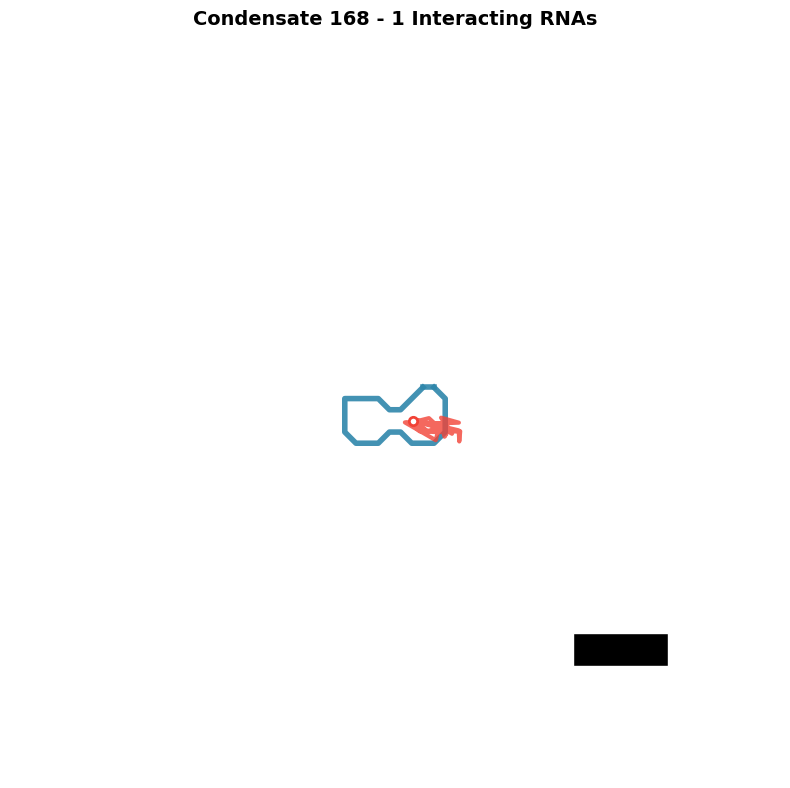

   ✅ Saved zoomed image for Condensate 168
   Condensate 169: No interacting RNAs found, skipping...
   Condensate 170: No interacting RNAs found, skipping...
   Condensate 171: No interacting RNAs found, skipping...
   Condensate 172: No interacting RNAs found, skipping...
   Condensate 173: No interacting RNAs found, skipping...
   Condensate 174: No interacting RNAs found, skipping...
   Condensate 175: No interacting RNAs found, skipping...
   Condensate 176: No interacting RNAs found, skipping...
   Condensate 177: No interacting RNAs found, skipping...
   Condensate 178: No interacting RNAs found, skipping...
   Condensate 179: No interacting RNAs found, skipping...
   Condensate 180: No interacting RNAs found, skipping...
   Condensate 181: No interacting RNAs found, skipping...
   Condensate 182: No interacting RNAs found, skipping...
   Condensate 183: No interacting RNAs found, skipping...
   Condensate 184: No interacting RNAs found, skipping...
   Condensate 185: Found 1 in

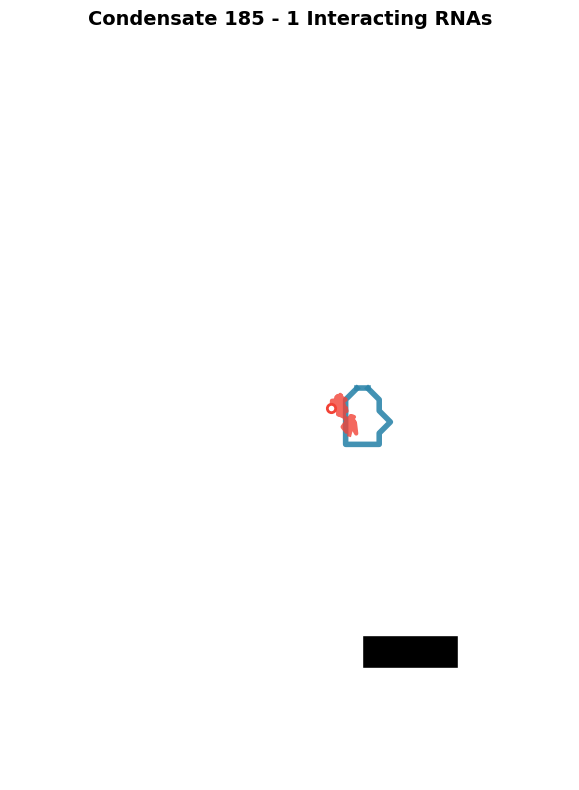

   ✅ Saved zoomed image for Condensate 185
   Condensate 186: No interacting RNAs found, skipping...
   Condensate 187: No interacting RNAs found, skipping...
   Condensate 188: No interacting RNAs found, skipping...
   Condensate 189: No interacting RNAs found, skipping...
   Condensate 190: No interacting RNAs found, skipping...
   Condensate 191: No interacting RNAs found, skipping...
   Condensate 192: No interacting RNAs found, skipping...
   Condensate 193: No interacting RNAs found, skipping...
   Condensate 194: No interacting RNAs found, skipping...
   Condensate 195: No interacting RNAs found, skipping...
   Condensate 196: No interacting RNAs found, skipping...
   Condensate 197: No interacting RNAs found, skipping...
   Condensate 198: No interacting RNAs found, skipping...
   Condensate 199: No interacting RNAs found, skipping...
   Condensate 200: No interacting RNAs found, skipping...
   Condensate 201: No interacting RNAs found, skipping...
   Condensate 202: Found 1 in

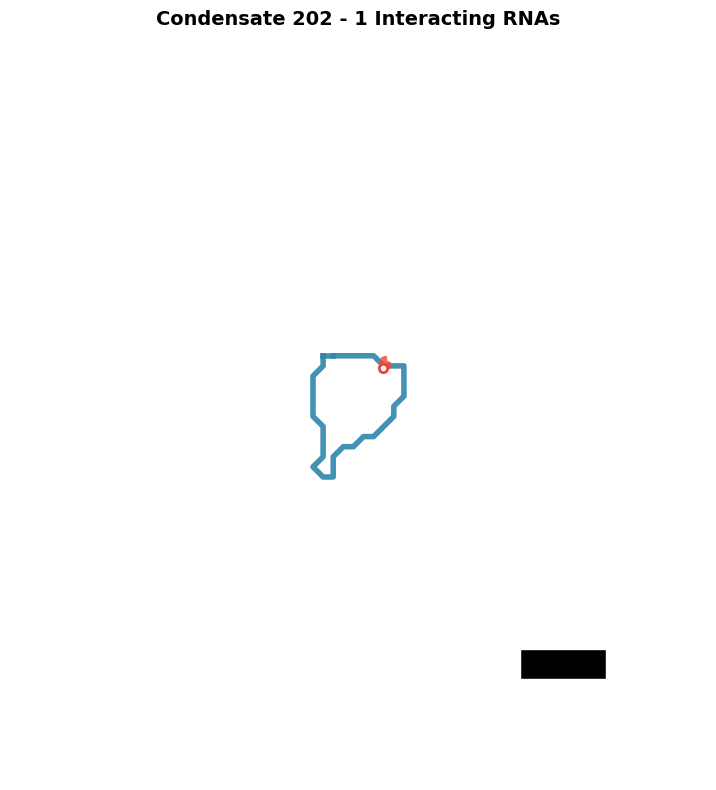

   ✅ Saved zoomed image for Condensate 202
   Condensate 203: No interacting RNAs found, skipping...
   Condensate 204: No interacting RNAs found, skipping...
   Condensate 205: No interacting RNAs found, skipping...
   Condensate 206: No interacting RNAs found, skipping...
   Condensate 207: No interacting RNAs found, skipping...
   Condensate 208: No interacting RNAs found, skipping...
   Condensate 209: No interacting RNAs found, skipping...
   Condensate 210: No interacting RNAs found, skipping...
   Condensate 211: No interacting RNAs found, skipping...
   Condensate 212: No interacting RNAs found, skipping...
   Condensate 213: No interacting RNAs found, skipping...
   Condensate 214: No interacting RNAs found, skipping...
   Condensate 215: No interacting RNAs found, skipping...
   Condensate 216: No interacting RNAs found, skipping...
   Condensate 217: No interacting RNAs found, skipping...
   Condensate 218: No interacting RNAs found, skipping...
   Condensate 219: No interac

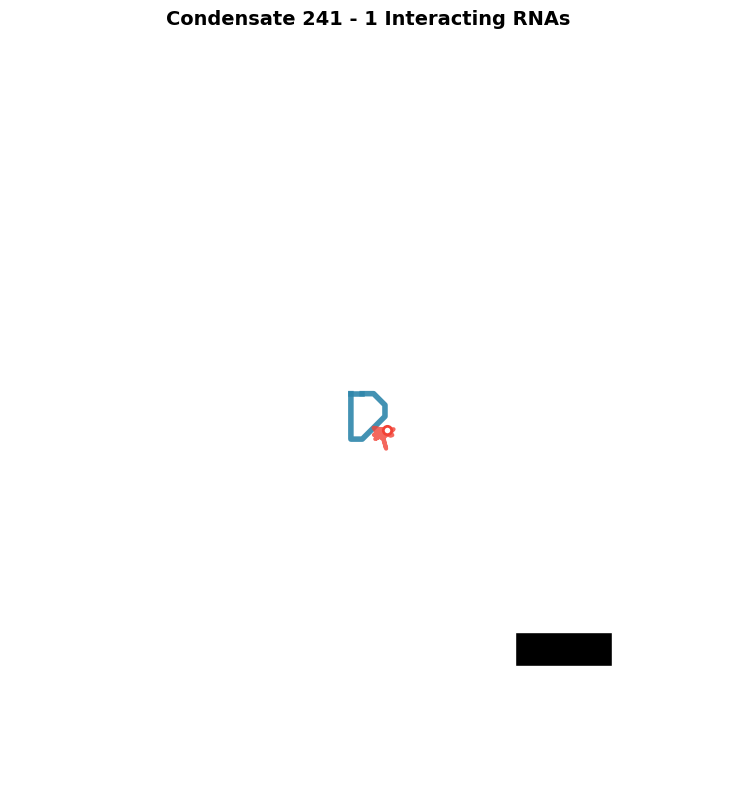

   ✅ Saved zoomed image for Condensate 241
   Condensate 242: No interacting RNAs found, skipping...
   Condensate 243: No interacting RNAs found, skipping...
   Condensate 244: No interacting RNAs found, skipping...
   Condensate 245: No interacting RNAs found, skipping...
   Condensate 246: No interacting RNAs found, skipping...
   Condensate 247: No interacting RNAs found, skipping...
   Condensate 248: No interacting RNAs found, skipping...
   Condensate 249: No interacting RNAs found, skipping...
   Condensate 250: No interacting RNAs found, skipping...
   Condensate 251: No interacting RNAs found, skipping...
   Condensate 252: No interacting RNAs found, skipping...
   Condensate 253: No interacting RNAs found, skipping...
   Condensate 254: No interacting RNAs found, skipping...
   Condensate 255: No interacting RNAs found, skipping...
   Condensate 256: No interacting RNAs found, skipping...
   Condensate 257: No interacting RNAs found, skipping...
   Condensate 258: No interac

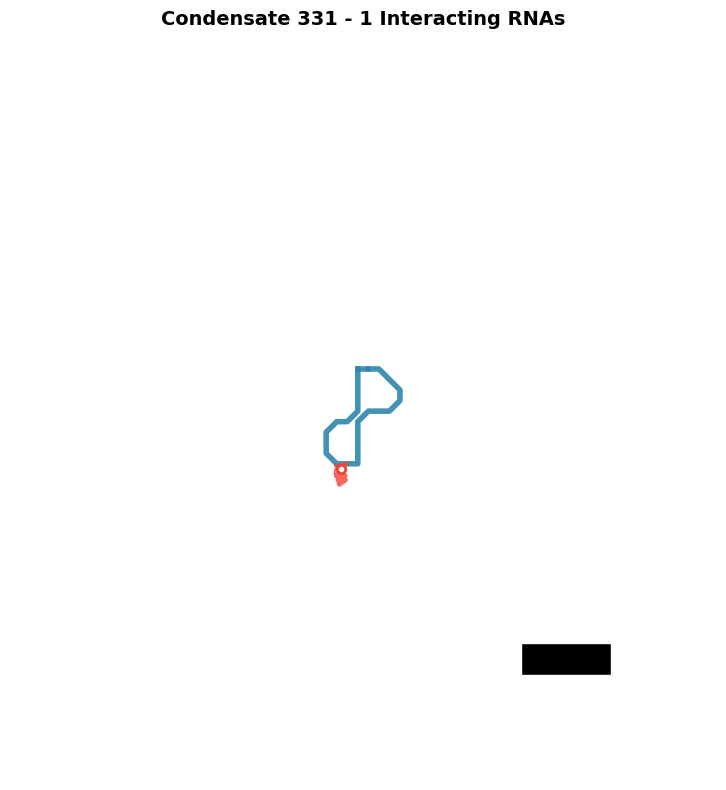

   ✅ Saved zoomed image for Condensate 331
   Condensate 332: No interacting RNAs found, skipping...
   Condensate 333: No interacting RNAs found, skipping...
   Condensate 334: No interacting RNAs found, skipping...
   Condensate 335: No interacting RNAs found, skipping...
   Condensate 336: No interacting RNAs found, skipping...
   Condensate 337: No interacting RNAs found, skipping...
   Condensate 338: No interacting RNAs found, skipping...
   Condensate 339: No interacting RNAs found, skipping...
   Condensate 340: No interacting RNAs found, skipping...
   Condensate 341: No interacting RNAs found, skipping...
   Condensate 342: No interacting RNAs found, skipping...
   Condensate 343: No interacting RNAs found, skipping...
   Condensate 344: No interacting RNAs found, skipping...
   Condensate 345: No interacting RNAs found, skipping...
   Condensate 346: No interacting RNAs found, skipping...
   Condensate 347: No interacting RNAs found, skipping...
   Condensate 348: No interac

In [369]:
# ZOOMED CONDENSATE IMAGES: Individual plots with interacting RNAs and scale bars
print("🔍 Creating zoomed images for each condensate with interacting RNAs...")

if video is not None and df_tracks is not None and df_condensates is not None:
    
    final_frame = int(df_tracks['t'].max()) + 1
    img_blue = video[final_frame - 1, 1, :, :]
    height, width = img_blue.shape
    
    # Get contour boundaries (reuse from previous block)
    contour_boundaries = get_contour_coords(df_condensates, final_frame - 1)
    
    # Parameters for zooming
    zoom_margin = 30  # pixels around condensate for zoom window
    proximity_threshold = 0  # distance threshold for interaction
    
    # Color palette for multiple tracks per condensate
    track_colors = ['#F24236', '#E66100', '#A63603', '#D95F02', '#CC79A7', '#56B4E9']
    
    print(f"Processing {len(contour_boundaries)} condensates...")
    
    for condensate_idx, (cx, cy) in enumerate(contour_boundaries):
        
        # Find all tracks that interact with THIS specific condensate
        condensate_interacting_tracks = []
        
        for track_id in df_tracks['trackID'].unique():
            track_data = df_tracks[
                (df_tracks['trackID'] == track_id) & 
                (df_tracks['t'] <= final_frame - 1)
            ].sort_values('t')
            
            # Check if any point in track is close to THIS condensate
            track_interacts = False
            for _, point in track_data.iterrows():
                distances = np.sqrt((cx - point['x'])**2 + (cy - point['y'])**2)
                if np.any(distances <= proximity_threshold):
                    track_interacts = True
                    break
            
            if track_interacts and len(track_data) > 1:
                condensate_interacting_tracks.append(track_data)
        
        # Skip if no interacting tracks found
        if not condensate_interacting_tracks:
            print(f"   Condensate {condensate_idx + 1}: No interacting RNAs found, skipping...")
            continue
        
        print(f"   Condensate {condensate_idx + 1}: Found {len(condensate_interacting_tracks)} interacting tracks")
        
        # Calculate zoom window around condensate
        min_x, max_x = np.min(cx), np.max(cx)
        min_y, max_y = np.min(cy), np.max(cy)
        
        # Add margin and ensure within image bounds
        zoom_xmin = max(0, int(min_x - zoom_margin))
        zoom_xmax = min(width, int(max_x + zoom_margin))
        zoom_ymin = max(0, int(min_y - zoom_margin))
        zoom_ymax = min(height, int(max_y + zoom_margin))
        
        # Create zoomed figure
        fig, ax = plt.subplots(1, 1, figsize=(8, 8))
        ax.set_facecolor('white')
        fig.patch.set_facecolor('white')
        
        # Plot condensate boundary in professional blue
        ax.plot(cx, cy, lw=4, c="#2E86AB", alpha=0.9, label=f'Condensate {condensate_idx + 1}')
        ax.plot([cx[-1], cx[0]], [cy[-1], cy[0]], c="#2E86AB", lw=4, alpha=0.9)
        
        # Plot each interacting track with different colors
        for track_idx, track_data in enumerate(condensate_interacting_tracks):
            color = track_colors[track_idx % len(track_colors)]
            ax.plot(
                track_data['x'], track_data['y'],
                color=color,
                alpha=0.8,
                linewidth=3,
                label=f'Track {int(track_data.iloc[0]["trackID"])}'
            )
            
            # Mark start point
            ax.plot(
                track_data.iloc[0]['x'], track_data.iloc[0]['y'],
                marker='o', markersize=6, color=color,
                markerfacecolor='white', markeredgewidth=2
            )
        
        # Add condensate label
        # center_x, center_y = np.mean(cx), np.mean(cy)
        # ax.text(
        #     center_x, center_y - 15,
        #     f'C{condensate_idx + 1}',
        #     fontsize=14,
        #     color='white',
        #     fontweight='bold',
        #     ha='center',
        #     bbox=dict(boxstyle='circle,pad=0.3', facecolor="#2E86AB", alpha=0.8)
        # )
        
        # Add scale bar for zoomed image
        scalebar_length_pixels = 1.0 / um_per_pixel  # 1 μm scale bar for zoom
        scalebar_thickness = 3
        scale_margin = 10
        scale_x_start = zoom_xmax - scalebar_length_pixels - scale_margin
        scale_y_pos = zoom_ymax - scale_margin - scalebar_thickness
        
        scalebar = Rectangle(
            (scale_x_start, scale_y_pos), scalebar_length_pixels, scalebar_thickness,
            facecolor='black', edgecolor='white', linewidth=1
        )
        ax.add_patch(scalebar)
        
        # ax.text(
        #     scale_x_start + scalebar_length_pixels/2, scale_y_pos - 8, '1 μm',
        #     ha='center', va='top', color='black', fontsize=10, fontweight='bold',
        #     bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.9)
        # )
        
        # Set zoom limits and styling
        ax.set_xlim(zoom_xmin, zoom_xmax)
        ax.set_ylim(zoom_ymax, zoom_ymin)  # Invert Y for image coordinates
        ax.set_aspect('equal')
        ax.axis('off')
        
        # Add legend if multiple tracks
        if len(condensate_interacting_tracks) > 1:
            ax.legend(
                loc='upper left', 
                frameon=True, 
                fancybox=True, 
                shadow=True,
                fontsize=8,
                framealpha=0.9
            )
        
        # Add title with interaction count
        ax.set_title(
            f'Condensate {condensate_idx + 1} - {len(condensate_interacting_tracks)} Interacting RNAs',
            fontsize=14,
            fontweight='bold',
            pad=20,
            color='black'
        )
        
        # PROPER SAVING ORDER
        plt.tight_layout()
        plt.savefig(
            f"zoomed_condensate_{condensate_idx + 1:02d}_interacting_{final_frame:03d}.png",
            format="png",
            bbox_inches="tight",
            dpi=300,
            facecolor='white',
            edgecolor='none'
        )
        plt.show()
        plt.close()
        
        print(f"   ✅ Saved zoomed image for Condensate {condensate_idx + 1}")
    
    print(f"🎉 All zoomed condensate images created successfully!")
    
else:
    print("❌ Cannot create zoomed images - missing data!")
